In [59]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
base = pd.read_csv(r'C:/Users/carol/Downloads/Watches.csv', low_memory=False)

In [3]:
base.head(5)

,Unnamed: 0,name,price,brand,model,ref,mvmt,casem,bracem,yop,cond,sex,size,condition
0,0,Audemars Piguet Royal Oak Offshore Chronograph...,"$43,500",Audemars Piguet,Royal Oak Offshore Chronograph,26237ST.OO.1000ST.01,NaN,NaN,NaN,2019,Unworn,Men's watch/Unisex,42 mm,NaN
1,1,Audemars Piguet Royal Oak Selfwinding\n39mm Bl...,"$71,500",Audemars Piguet,Royal Oak Selfwinding,15300ST.OO.1220ST.02,NaN,NaN,NaN,2012,Very good,Men's watch/Unisex,39 mm,NaN
2,2,Audemars Piguet Royal Oak Chronograph\nBlue Di...,"$79,191",Audemars Piguet,Royal Oak Chronograph,26331ST,Automatic,Steel,Steel,Unknown,Unworn,NaN,41 mm,NaN
3,3,Audemars Piguet Royal Oak Chronograph\nSelfwin...,"$108,000",Audemars Piguet,Royal Oak Chronograph,26715ST.OO.1356ST.01,Automatic,Steel,Steel,2022 (Approximation),New,Men's watch/Unisex,38 mm,NaN
4,4,Audemars Piguet Royal Oak Offshore Chronograph...,"$27,500",Audemars Piguet,Royal Oak Offshore Chronograph,26170ST.OO.1000ST.01,Automatic,Steel,Steel,Unknown,Very good,Men's watch/Unisex,42 x 54 mm,NaN


In [4]:
base = base.drop('Unnamed: 0', axis=1)

In [5]:
base.head(5)

,name,price,brand,model,ref,mvmt,casem,bracem,yop,cond,sex,size,condition
0,Audemars Piguet Royal Oak Offshore Chronograph...,"$43,500",Audemars Piguet,Royal Oak Offshore Chronograph,26237ST.OO.1000ST.01,NaN,NaN,NaN,2019,Unworn,Men's watch/Unisex,42 mm,NaN
1,Audemars Piguet Royal Oak Selfwinding\n39mm Bl...,"$71,500",Audemars Piguet,Royal Oak Selfwinding,15300ST.OO.1220ST.02,NaN,NaN,NaN,2012,Very good,Men's watch/Unisex,39 mm,NaN
2,Audemars Piguet Royal Oak Chronograph\nBlue Di...,"$79,191",Audemars Piguet,Royal Oak Chronograph,26331ST,Automatic,Steel,Steel,Unknown,Unworn,NaN,41 mm,NaN
3,Audemars Piguet Royal Oak Chronograph\nSelfwin...,"$108,000",Audemars Piguet,Royal Oak Chronograph,26715ST.OO.1356ST.01,Automatic,Steel,Steel,2022 (Approximation),New,Men's watch/Unisex,38 mm,NaN
4,Audemars Piguet Royal Oak Offshore Chronograph...,"$27,500",Audemars Piguet,Royal Oak Offshore Chronograph,26170ST.OO.1000ST.01,Automatic,Steel,Steel,Unknown,Very good,Men's watch/Unisex,42 x 54 mm,NaN


In [6]:
base = base.reset_index(drop=True)

In [7]:
base.head(3)

,name,price,brand,model,ref,mvmt,casem,bracem,yop,cond,sex,size,condition
0,Audemars Piguet Royal Oak Offshore Chronograph...,"$43,500",Audemars Piguet,Royal Oak Offshore Chronograph,26237ST.OO.1000ST.01,NaN,NaN,NaN,2019,Unworn,Men's watch/Unisex,42 mm,NaN
1,Audemars Piguet Royal Oak Selfwinding\n39mm Bl...,"$71,500",Audemars Piguet,Royal Oak Selfwinding,15300ST.OO.1220ST.02,NaN,NaN,NaN,2012,Very good,Men's watch/Unisex,39 mm,NaN
2,Audemars Piguet Royal Oak Chronograph\nBlue Di...,"$79,191",Audemars Piguet,Royal Oak Chronograph,26331ST,Automatic,Steel,Steel,Unknown,Unworn,NaN,41 mm,NaN


In [8]:
base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284491 entries, 0 to 284490
Data columns (total 13 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   name       211906 non-null  object
 1   price      284085 non-null  object
 2   brand      284360 non-null  object
 3   model      254025 non-null  object
 4   ref        241339 non-null  object
 5   mvmt       87806 non-null   object
 6   casem      120220 non-null  object
 7   bracem     109595 non-null  object
 8   yop        284357 non-null  object
 9   cond       208504 non-null  object
 10  sex        188686 non-null  object
 11  size       260894 non-null  object
 12  condition  71569 non-null   object
dtypes: object(13)
memory usage: 28.2+ MB


In [9]:
base.shape

(284491, 13)

In [10]:
base.isnull().sum()

name          72585
price           406
brand           131
model         30466
ref           43152
mvmt         196685
casem        164271
bracem       174896
yop             134
cond          75987
sex           95805
size          23597
condition    212922
dtype: int64

In [11]:
# substituição dos valores vazios pela moda
moda = base.mode().iloc[0]
base = base.fillna(moda)

base.isnull().sum()

name         0
price        0
brand        0
model        0
ref          0
mvmt         0
casem        0
bracem       0
yop          0
cond         0
sex          0
size         0
condition    0
dtype: int64

In [12]:
#retirada do '$' na coluna price para possibilitar cálculos
base.price = base.price.str.replace('[^\d]', '',regex = True)
base.price = pd.to_numeric(base.price,errors = 'coerce')


In [13]:
base.head(5)

,name,price,brand,model,ref,mvmt,casem,bracem,yop,cond,sex,size,condition
0,Audemars Piguet Royal Oak Offshore Chronograph...,43500.0,Audemars Piguet,Royal Oak Offshore Chronograph,26237ST.OO.1000ST.01,Automatic,Steel,Steel,2019,Unworn,Men's watch/Unisex,42 mm,Very good
1,Audemars Piguet Royal Oak Selfwinding\n39mm Bl...,71500.0,Audemars Piguet,Royal Oak Selfwinding,15300ST.OO.1220ST.02,Automatic,Steel,Steel,2012,Very good,Men's watch/Unisex,39 mm,Very good
2,Audemars Piguet Royal Oak Chronograph\nBlue Di...,79191.0,Audemars Piguet,Royal Oak Chronograph,26331ST,Automatic,Steel,Steel,Unknown,Unworn,Men's watch/Unisex,41 mm,Very good
3,Audemars Piguet Royal Oak Chronograph\nSelfwin...,108000.0,Audemars Piguet,Royal Oak Chronograph,26715ST.OO.1356ST.01,Automatic,Steel,Steel,2022 (Approximation),New,Men's watch/Unisex,38 mm,Very good
4,Audemars Piguet Royal Oak Offshore Chronograph...,27500.0,Audemars Piguet,Royal Oak Offshore Chronograph,26170ST.OO.1000ST.01,Automatic,Steel,Steel,Unknown,Very good,Men's watch/Unisex,42 x 54 mm,Very good


In [14]:
base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284491 entries, 0 to 284490
Data columns (total 13 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   name       284491 non-null  object 
 1   price      269826 non-null  float64
 2   brand      284491 non-null  object 
 3   model      284491 non-null  object 
 4   ref        284491 non-null  object 
 5   mvmt       284491 non-null  object 
 6   casem      284491 non-null  object 
 7   bracem     284491 non-null  object 
 8   yop        284491 non-null  object 
 9   cond       284491 non-null  object 
 10  sex        284491 non-null  object 
 11  size       284491 non-null  object 
 12  condition  284491 non-null  object 
dtypes: float64(1), object(12)
memory usage: 28.2+ MB


In [15]:
moda_preco = base.price.mode()[0]
base.price.fillna(moda_preco, inplace = True)

In [16]:
base.isnull().sum()

name         0
price        0
brand        0
model        0
ref          0
mvmt         0
casem        0
bracem       0
yop          0
cond         0
sex          0
size         0
condition    0
dtype: int64

In [17]:
base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284491 entries, 0 to 284490
Data columns (total 13 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   name       284491 non-null  object 
 1   price      284491 non-null  float64
 2   brand      284491 non-null  object 
 3   model      284491 non-null  object 
 4   ref        284491 non-null  object 
 5   mvmt       284491 non-null  object 
 6   casem      284491 non-null  object 
 7   bracem     284491 non-null  object 
 8   yop        284491 non-null  object 
 9   cond       284491 non-null  object 
 10  sex        284491 non-null  object 
 11  size       284491 non-null  object 
 12  condition  284491 non-null  object 
dtypes: float64(1), object(12)
memory usage: 28.2+ MB


In [18]:
base.yop.value_counts()

Unknown                 96091
2023                    49227
2022                    20654
2021                    10501
2023 (Approximation)     6136
                        ...  
1960, 1968, 1975            1
1852 (Approximation)        1
2016, 2017, 2018            1
2007, 2010, 2012            1
1650 (Approximation)        1
Name: yop, Length: 410, dtype: int64

In [19]:
mais_recentes = base.yop.value_counts().nlargest(10)
mais_recentes

Unknown                 96091
2023                    49227
2022                    20654
2021                    10501
2023 (Approximation)     6136
2020                     5573
2019                     4501
2022 (Approximation)     4132
2018                     3781
2017                     2877
Name: yop, dtype: int64

In [20]:
fig = px.bar(x=mais_recentes.index, y=mais_recentes.values,labels={'x': 'Marcas', 'y': 'Número de Relógios'},
             title='Quantidade de relógios fabricados por ano')

fig.update_xaxes(tickangle=45)

fig.show()

A maior parte dos relógios tem ano desconhecido de fabricação

In [21]:
top10_marcas = base.brand.value_counts().nlargest(10)
top10_marcas

Rolex              72615
Omega              39631
Seiko              19297
Breitling          18066
Cartier            16607
Longines           15221
Audemars Piguet    12987
TAG Heuer          12908
Hublot             12750
Patek Philippe     12397
Name: brand, dtype: int64

In [22]:
fig = px.bar(x=top10_marcas.index, y=top10_marcas.values,labels={'x': 'Marcas', 'y': 'Número de Relógios'},
             title='Os dez relógios mais vendidos')

fig.update_xaxes(tickangle=45)

fig.show()

A grande diferença se dá entre as marcas Rolex e Omega, as quais diferem bastante dos números das outras marcas, sendo que essas são bastantes semelhantes entre si.

In [23]:
#separando os preços em três categorias para melhor visualização
inferior = base[base['price'] < 20000]
mediana = base[(base['price'] >= 20000) & (base['price'] < 90000)]
superior = base[(base['price']  >= 90000) & (base['price'] < 100000)]

In [24]:
contagem_modelos = inferior.groupby('brand')['model'].nunique().reset_index()

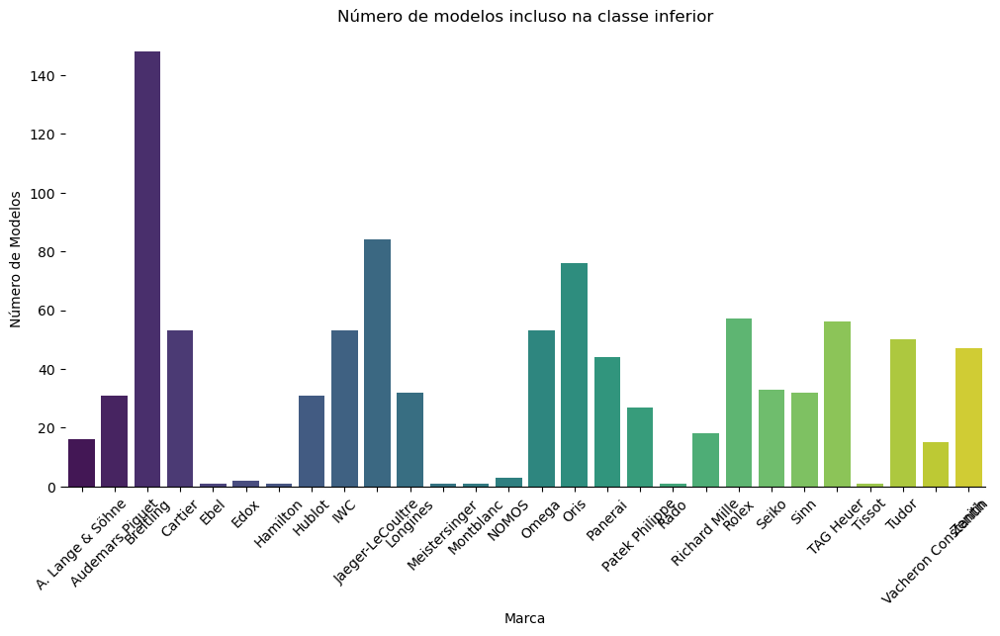

In [25]:
plt.figure(figsize=(12,6))
sns.barplot(x = 'brand', y ='model', data= contagem_modelos, palette='viridis')
plt.xlabel('Marca')
plt.ylabel('Número de Modelos')
plt.title('Número de modelos incluso na classe inferior')
plt.xticks(rotation = 45)
sns.despine(left=True)
plt.show()

In [26]:
contagem_modelos = mediana.groupby('brand')['model'].nunique().reset_index()

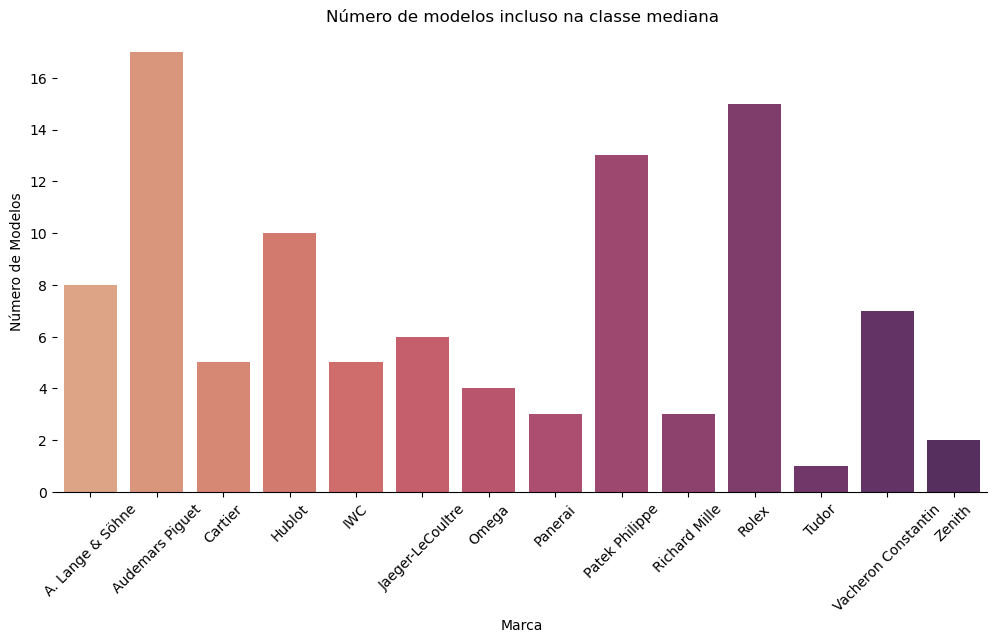

In [38]:
plt.figure(figsize=(12,6))
sns.barplot(x = 'brand', y ='model', data= contagem_modelos, palette='flare')
plt.xlabel('Marca')
plt.ylabel('Número de Modelos')
plt.title('Número de modelos incluso na classe mediana')
plt.xticks(rotation = 45)
sns.despine(left=True)
plt.show()

In [28]:
contagem_modelos = superior.groupby('brand')['model'].nunique().reset_index()

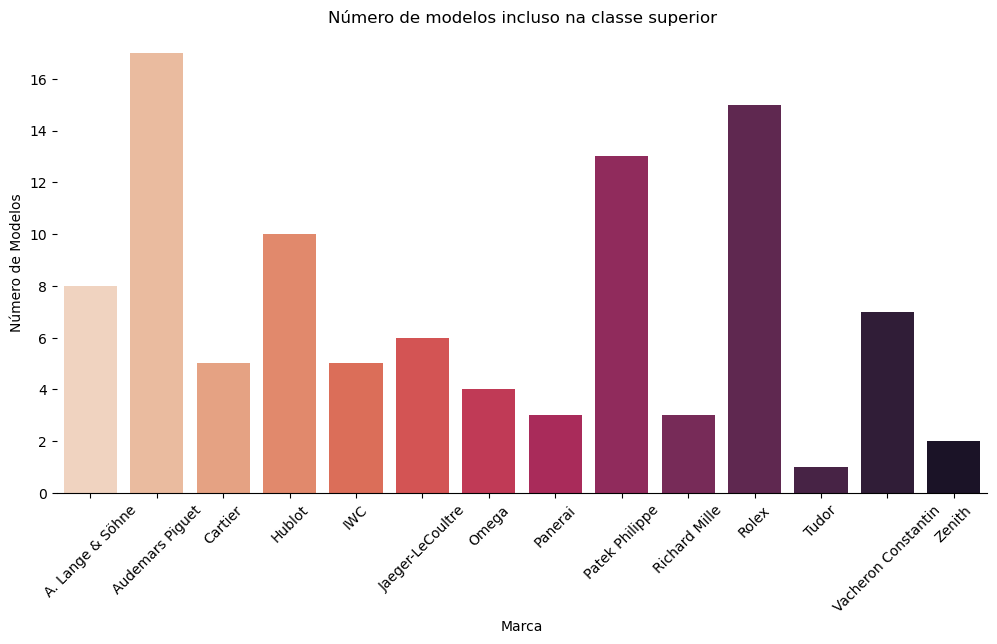

In [40]:
plt.figure(figsize=(12,6))
sns.barplot(x = 'brand', y ='model', data= contagem_modelos, palette='rocketr')
plt.xlabel('Marca')
plt.ylabel('Número de Modelos')
plt.title('Número de modelos incluso na classe superior')
plt.xticks(rotation = 45)
sns.despine(left=True)

plt.show()

In [30]:
#criação de histogramas para cada classe com as marcas mais populares
marcas_mais_pop = inferior['brand'].value_counts().head(3)
marcas_mais_pop


Rolex    51380
Omega    38161
Seiko    19273
Name: brand, dtype: int64

In [42]:
#criando o gráfico para a classe inferior
fig =px.histogram(inferior['price'], nbins=20, labels={'value':'Preço', 'count': 'Frequência'})
fig.update_traces(marker_color='DarkSlateGrey', marker_line_color = 'black', marker_line_width= 2)
fig.update_layout(title = 'Histograma de Distribuição do Preço na Classe Inferior')
fig.show()

In [32]:
# para classe mediana
marcas_mais_pop = mediana['brand'].value_counts().head(3)
marcas_mais_pop

Rolex              19835
Audemars Piguet     7261
Patek Philippe      5018
Name: brand, dtype: int64

In [43]:
#criando o gráfico para a classe mediana
fig =px.histogram(mediana['price'], nbins=20, labels={'value':'Preço', 'count': 'Frequência'})
fig.update_traces(marker_color='DarkSlateGrey', marker_line_color = 'black', marker_line_width= 2)
fig.update_layout(title = 'Histograma de Distribuição do Preço na Classe Mediana')
fig.show()

In [34]:
# para classe superior
marcas_mais_pop = superior['brand'].value_counts().head(3)
marcas_mais_pop

Patek Philippe     497
Audemars Piguet    299
Rolex              283
Name: brand, dtype: int64

In [47]:
#criando o gráfico para a classe superior
fig =px.histogram(superior['price'], nbins=20, labels={'value':'Preço', 'count': 'Frequência'})
fig.update_traces(marker_color='DarkSlateGrey', marker_line_color = 'black', marker_line_width= 2)
fig.update_layout(title = 'Histograma de Distribuição do Preço na Classe Superior')
fig.show()

In [48]:
base.head(3)

,name,price,brand,model,ref,mvmt,casem,bracem,yop,cond,sex,size,condition
0,Audemars Piguet Royal Oak Offshore Chronograph...,43500.0,Audemars Piguet,Royal Oak Offshore Chronograph,26237ST.OO.1000ST.01,Automatic,Steel,Steel,2019,Unworn,Men's watch/Unisex,42 mm,Very good
1,Audemars Piguet Royal Oak Selfwinding\n39mm Bl...,71500.0,Audemars Piguet,Royal Oak Selfwinding,15300ST.OO.1220ST.02,Automatic,Steel,Steel,2012,Very good,Men's watch/Unisex,39 mm,Very good
2,Audemars Piguet Royal Oak Chronograph\nBlue Di...,79191.0,Audemars Piguet,Royal Oak Chronograph,26331ST,Automatic,Steel,Steel,Unknown,Unworn,Men's watch/Unisex,41 mm,Very good


In [85]:
material = base['casem'].value_counts().head(10)
material

Steel          240064
Gold/Steel      11031
Rose gold        9320
Yellow gold      7875
Titanium         5188
White gold       5174
Ceramic          2621
Platinum         1202
Red gold          669
Bronze            541
Name: casem, dtype: int64

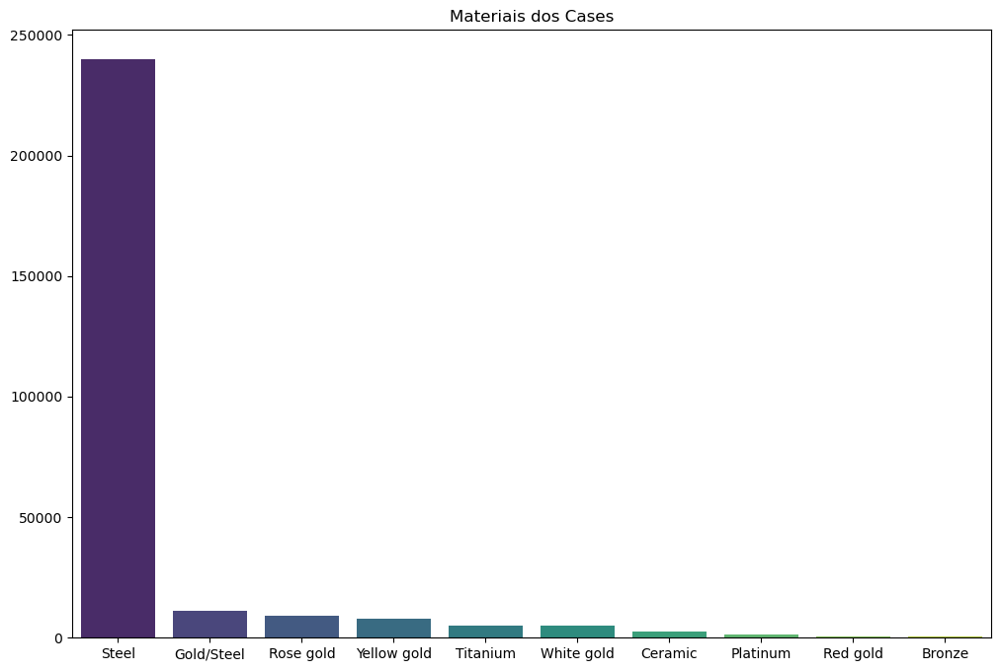

In [86]:
#gráfico dos materias mais frequntes de cases
plt.figure(figsize=(12, 8)) 
sns.barplot(x=material.index, y= material.values, data=base, palette='viridis')


plt.title('Materiais dos Cases')


plt.show()

In [88]:
pulseira = base['bracem'].value_counts().head(10)
pulseira

Steel             224501
Leather            15657
Rubber             11271
Gold/Steel         10030
Crocodile skin      8475
Yellow gold         4213
Rose gold           2705
White gold          1773
Textile             1639
Titanium            1368
Name: bracem, dtype: int64

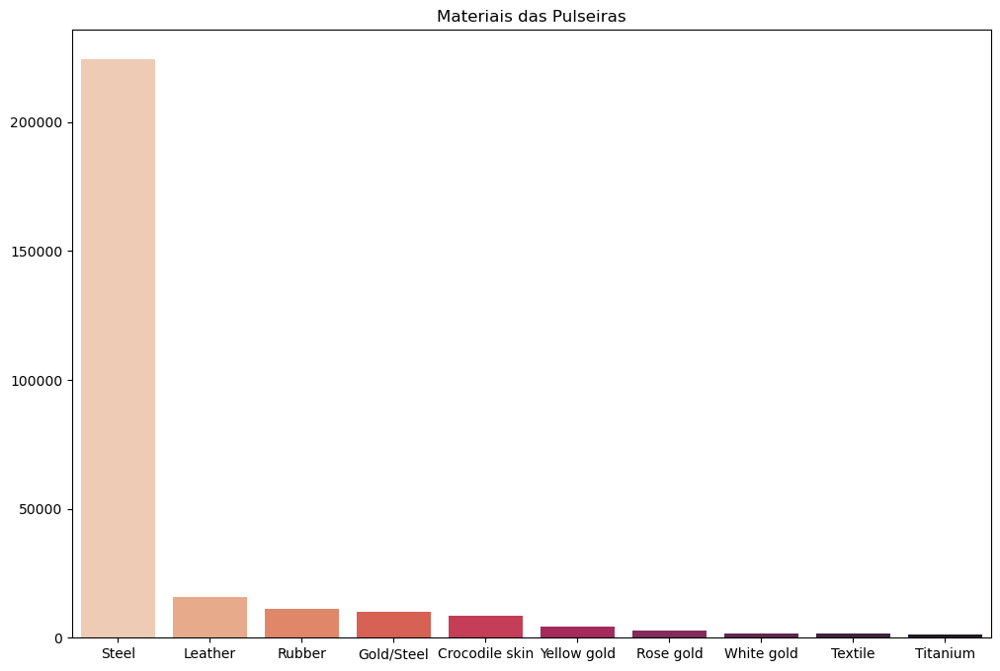

In [91]:
#gráfico dos materias mais frequntes de cases
plt.figure(figsize=(12, 8)) 
sns.barplot(x=pulseira.index, y= pulseira.values, data=base, palette='rocket_r')


plt.title('Materiais das Pulseiras')


plt.show()